In [1]:
import numpy as np
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from tqdm import tqdm

In [2]:
import os
import cv2
#import xml.etree.ElementTree as ET
import lxml.etree as ET
import tifffile

In [3]:
def overlay(tif_path='TMA_3.tif', xml_path='213_HIVE1_Padded.xml',num_cluster=4, dataframe=''):
    # Load the TIF image
    colors = ['red', 'blue', 'green', 'orange', 'white', 'yellow', 'pink', 'gray', 'olive', 'cyan',
               'magenta', 'brown', 'navy', 'teal', 'maroon', 'lime', 'indigo', 'gold', 'crimson', 'violet']

    image = tifffile.imread(tif_path)
    
    # Improve contrast
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    
    # Load the XML annotations
    tree = ET.parse(xml_path)
    root = tree.getroot()

    # Extract the vertices for each region
    vertices = []
    for region in root.iter('Region'):
        vertices.append([(int(vertex.get('X')), int(vertex.get('Y'))) for vertex in region.iter('Vertex')])
    
    # Plot the image and annotations
    fig = plt.figure(figsize=(100,100))
    plt.imshow(clahe.apply(image[0]),cmap='gray')
    for j,verts in enumerate(vertices):
        print(j)
        if j in [2059, 5347, 5722, 9573]:
            pass
        else:
            plt.fill([v[0] for v in verts], [v[1] for v in verts], color=colors[dataframe[j]], alpha=0.3)

    plt.show()


# Load Clustering DATA

In [6]:
df5 = pd.read_csv('umap_data.csv')
l5 = len(np.unique(df5['cluster_id']))
labels5 = df5['cluster_id']

df2 = pd.read_csv('umap_data_cosine_0.2.csv')
l2 = len(np.unique(df2['cluster_id']))
labels2 = df2['cluster_id']

In [5]:
data_path = '/blue/pinaki.sarder/j.fermin/cell-mapping-data'

In [24]:
labels2

0         0
1         0
2        11
3         0
4         0
         ..
20983     0
20984     2
20985     8
20986     4
20987     2
Name: cluster_id, Length: 20988, dtype: int64

In [23]:
labels5

0         0
1         0
2        11
3         0
4         1
         ..
20983     0
20984     1
20985     8
20986     4
20987     1
Name: cluster_id, Length: 20988, dtype: int64

# UMAP Parameters: cosine, resolution = 0.2

KeyError: 20988

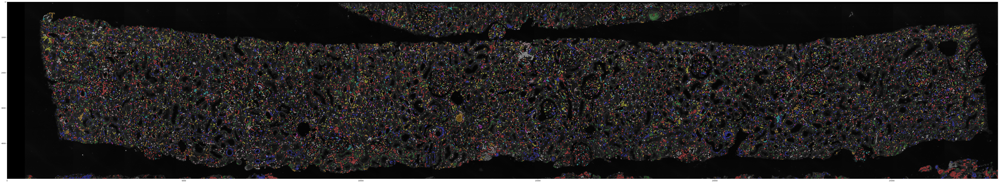

In [17]:
overlay(tif_path=os.path.join(data_path,'TMA_3.tif'), xml_path='213_Hive_Padded.xml',num_cluster=l2, dataframe=labels2)

# UMAP Parameters: Euclidean, resolution = 0.2

In [ ]:
overlay(tif_path=os.path.join(data_path,'TMA_3.tif'), xml_path='213_Hive_Padded.xml',num_cluster=l5, dataframe=labels5)

KeyError: 20988